Name: Jolene Butt
Course: DSC530-T301 Data Exploration and Analysis
Desc: Final Project WOW


In [1]:
'''
Data retrieved from Kaggle.com 
https://www.kaggle.com/cblesa/world-of-warcraft-battlegrounds
Dataset Owner Carlos Blesa

Note: in Anaconda powershell installed ploty

'''

'\nData retrieved from Kaggle.com \nhttps://www.kaggle.com/cblesa/world-of-warcraft-battlegrounds\nDataset Owner Carlos Blesa\n\n'

In [65]:
from __future__ import print_function, division
import numpy as np
import sys
import nsfg
import pandas as pd
from pandas import DataFrame
import os
import gc
import glob
import csv
from csv import reader
import sys
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_formate = 'svg'
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings("ignore")
import plotly
import plotly.express as px
import plotly.graph_objects as go
from plotly.colors import n_colors
import nsfg
import first
import thinkstats2
import thinkplot

In [66]:
os.chdir("/WoW_csv_files/")
extension = 'csv'
all_filenames = [i for i in glob.glob('*.{}'.format(extension))]

In [67]:
wowbgs = pd.read_csv("/WoW_csv_files/wowbgs.csv")
wowbgs2 = pd.read_csv("/WoW_csv_files/wowbgs2.csv")
wowgil = pd.read_csv("/WoW_csv_files/wowgil.csv")
wowgil2 = pd.read_csv("/WoW_csv_files/wowgil2.csv")
wowsm = pd.read_csv("/WoW_csv_files/wowsm.csv")
wowsm2 = pd.read_csv("/WoW_csv_files/wowsm2.csv")
wowtk = pd.read_csv("/WoW_csv_files/wowtk.csv")
wowtk2 = pd.read_csv("/WoW_csv_files/wowtk2.csv")
wowwg = pd.read_csv("/WoW_csv_files/wowwg.csv")
wowwg2 = pd.read_csv("/WoW_csv_files/wowwg2.csv")

In [4]:
print(os.listdir('/WoW_csv_files/'))

['wowbgs.csv', 'wowbgs2.csv', 'wowgil.csv', 'wowgil2.csv', 'wowsm.csv', 'wowsm2.csv', 'wowtk.csv', 'wowtk2.csv', 'wowwg.csv', 'wowwg2.csv']


In [6]:
combinedcsv = pd.concat([pd.read_csv(f) for f in all_filenames ])
combinedcsv.to_csv( "combinedcsv.csv", index=False, encoding='utf-8-sig')

In [68]:
print(os.listdir('/WoW_csv_files/'))

['combinedcsv.csv', 'wowbgs.csv', 'wowbgs2.csv', 'wowgil.csv', 'wowgil2.csv', 'wowsm.csv', 'wowsm2.csv', 'wowtk.csv', 'wowtk2.csv', 'wowwg.csv', 'wowwg2.csv']


In [69]:
dfwow = pd.read_csv('combinedcsv.csv', na_values="").fillna(0)
dfwow.replace(r'\s+', 0, regex=True)
dfwow.rename(columns={'Rol': 'Role'}, inplace=True)
dfwow.rename(columns={'DD': 'Damage'}, inplace=True)
dfwow.rename(columns={'HD': 'Healed'}, inplace=True)
dfwow.rename(columns={'KB': 'Kills'}, inplace=True)
dfwow.rename(columns={'HK': 'Honor Kills'}, inplace=True)
dfwow.rename(columns={'D': 'Died'}, inplace=True)
dfwow.rename(columns={'Battleground': 'BG'}, inplace=True)
dfwow.rename(columns={'Code': 'Battle Grounds'}, inplace=True)
dfwow.drop(['BE','BA','BD','CC','OP','VP','FC','FR',],axis=1,inplace=True)

In [9]:
list(dfwow)


['BG',
 'Battle Grounds',
 'Faction',
 'Class',
 'Kills',
 'Died',
 'Honor Kills',
 'Damage',
 'Healed',
 'Honor',
 'Win',
 'Lose',
 'Role']

In [10]:
dfwow.head

<bound method NDFrame.head of        BG Battle Grounds   Faction         Class  Kills  Died  Honor Kills  \
0      WG            WG1     Horde        Hunter      1     3           14   
1      WG            WG1     Horde  Death Knight      1     3           12   
2      WG            WG1  Alliance       Paladin      0     1           19   
3      WG            WG1  Alliance       Paladin      1     2           25   
4      WG            WG1  Alliance         Rogue      2     3           23   
...    ..            ...       ...           ...    ...   ...          ...   
87895   0           WG42  Alliance       Warrior      6     6           43   
87896   0           WG42  Alliance  Demon Hunter      1     5           36   
87897   0           WG42     Horde         Druid      0     5           42   
87898   0           WG42  Alliance       Paladin      0     4           38   
87899   0           WG42  Alliance  Death Knight     10     6           40   

       Damage  Healed  Honor  Win

In [11]:
print('Records dataframe size:', dfwow.shape)

Records dataframe size: (87900, 13)


In [70]:
def my_bar_plot(ax, name, data, x, y, xlabel='', ylabel='', orientation='horizontal',
                palette='pastel', format_spec='{:2.4f}%'):
    ax.set_title(name)
    sns.barplot(x=x, y=y, data=data, ax=ax, palette=palette)
    ax.set(xlabel=xlabel, ylabel=ylabel)
    
    if orientation == 'horizontal':
        for p in ax.patches:
            text = p.get_width()
            ax.text(x=p.get_x() + p.get_width() / 2., 
                y=p.get_y() + p.get_height() * 0.75,
                s=format_spec.format(text),
                ha="center",
                size="small",
                color='black')
        for tick in ax.get_yticklabels():
            tick.set_color(class_colormap[tick.get_text()])

In [71]:
import plotly.express as px

fig = px.scatter(dfwow, x="Faction", y="Class", color= "Role", title="Class Roles")

fig.show()

In [72]:
fig = px.scatter(dfwow, x="Role", y="Class",
                 facet_col="Role", title="Class Roles 2")

fig.update_xaxes(showgrid=False)

fig.show()

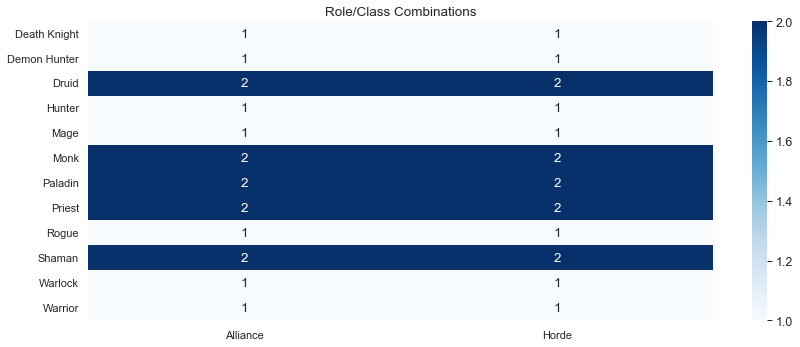

In [16]:
role_class_mix = dfwow.pivot_table(values='Role', index='Class', columns='Faction', aggfunc=lambda x: x.value_counts().count()).fillna(0).astype(int)

_, ax = plt.subplots(1, 1, figsize=(14, 5.5))
sns.set_context("paper", font_scale=1.4) 
sns.heatmap(role_class_mix, annot=True, cmap='Blues', fmt='g', ax=ax)
plt.title('Role/Class Combinations')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
ax.set_yticklabels(ax.get_yticklabels(), va='center')
ax.set(ylabel='', xlabel='')
plt.show()

In [43]:
class_names = sorted(dfwow['Class'].unique())
matches_num = len(dfwow['Battle Grounds'].unique())

print('Dataframe shape:', dfwow.shape)
print('Information on', matches_num, 'matches available.')
dfwow.head()

Dataframe shape: (87900, 13)
Information on 249 matches available.


,BG,Battle Grounds,Faction,Class,Kills,Died,Honor Kills,Damage,Healed,Honor,Win,Lose,Role
0,WG,WG1,Horde,Hunter,1,3,14,48155,6641,532,1.0,0.0,dps
1,WG,WG1,Horde,Death Knight,1,3,12,27025,7106,377,1.0,0.0,dps
2,WG,WG1,Alliance,Paladin,0,1,19,824,93879,252,0.0,1.0,heal
3,WG,WG1,Alliance,Paladin,1,2,25,7046,98599,274,0.0,1.0,heal
4,WG,WG1,Alliance,Rogue,2,3,23,65483,19629,268,0.0,1.0,dps


In [44]:
Healers = sorted(list(dfwow[dfwow['Role'] == 'heal']['Class'].unique()))
Killers = sorted(list(dfwow[dfwow['Role'] == 'dps']['Class'].unique()))

print('Healer classes:', *(Healers), sep='\n')
print('-' * 12)
print('DPS classes:', *(Killers), sep='\n')

Healer classes:
Druid
Monk
Paladin
Priest
Shaman
------------
DPS classes:
Death Knight
Demon Hunter
Druid
Hunter
Mage
Monk
Paladin
Priest
Rogue
Shaman
Warlock
Warrior


In [45]:
Alliance = sorted(list(dfwow[dfwow['Faction'] == 'Alliance']['Class'].unique()))
Horde = sorted(list(dfwow[dfwow['Faction'] == 'Horde']['Class'].unique()))

print('Alliance classes:', *(Alliance), sep='\n')
print('-' * 12)
print('Horde classes:', *(Horde), sep='\n')

Alliance classes:
Death Knight
Demon Hunter
Druid
Hunter
Mage
Monk
Paladin
Priest
Rogue
Shaman
Warlock
Warrior
------------
Horde classes:
Death Knight
Demon Hunter
Druid
Hunter
Mage
Monk
Paladin
Priest
Rogue
Shaman
Warlock
Warrior


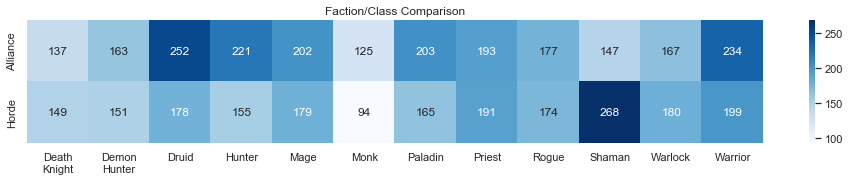

In [46]:
faction_class_mix = dfwow.pivot_table(values='Honor',
                                       index='Faction',
                                       columns='Class',
                                       aggfunc=lambda x: x.value_counts().count()).astype(int)
faction_class_mix.rename({'Death Knight': 'Death\nKnight', 'Demon Hunter': 'Demon\nHunter'}, axis=1, inplace=True)
_, ax = plt.subplots(1, 1, figsize=(16.5, 2.25))
sns.heatmap(faction_class_mix, annot=True, cmap='Blues', fmt='g', ax=ax)
plt.title('Faction/Class Comparison')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
ax.set_yticklabels(ax.get_yticklabels(), va='center')
ax.set(ylabel='', xlabel='')
plt.show()

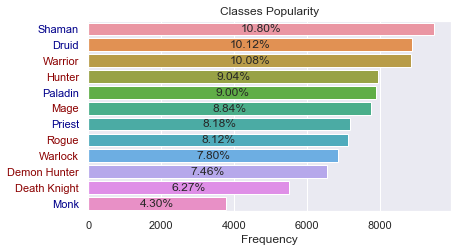

In [47]:
_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Classes Popularity")
sns.countplot(y='Class',
              data=dfwow,
              ax=ax,
              order = dfwow['Class'].value_counts().index)
ax.set(ylabel='', xlabel='Frequency')

total = float(len(dfwow))
for p in ax.patches:
    width = p.get_width()
    ax.text(x=p.get_x() + p.get_width() / 2., 
              y=p.get_y() + p.get_height() * 0.75,
              s='{:1.2f}%'.format(width/total * 100),
              ha="center")

heal_dict, dps_dict = {x: 'darkblue' for x in Healers}, {x: 'darkred' for x in Killers}
class_colormap = {**dps_dict, **heal_dict}

for tick in ax.get_yticklabels():
    tick.set_color(class_colormap[tick.get_text()])
plt.show()

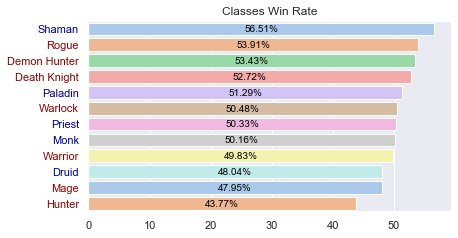

In [48]:
class_winrate = round(dfwow.groupby(['Class'], as_index=False)['Win'].mean().sort_values(by=['Win'], ascending=False), 4)
class_winrate['Win'] *= 100

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name="Classes Win Rate", data=class_winrate, x='Win',
            y='Class', orientation='horizontal', format_spec='{:1.2f}%')
plt.show()

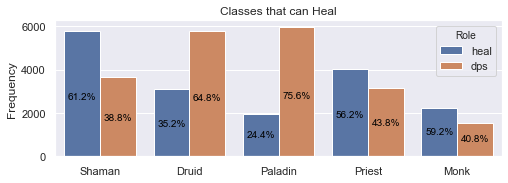

In [49]:
_, ax = plt.subplots(1, 1, figsize=(8, 2.5))
ax.set_title("Classes that can Heal")
sns.countplot(x='Class',
              hue='Role',
              data=dfwow[dfwow['Class'].isin(Healers)],
              ax=ax,
              order=dfwow[dfwow['Class'].isin(Healers)]['Class'].value_counts().index)
ax.set(ylabel='Frequency', xlabel='')

dps_patches = ax.patches[:5]
heal_patches = ax.patches[5:]
patches = list(zip(dps_patches, heal_patches ))

for p in patches:
    height = [p[i].get_height() for i in range(2)]
    total = sum(height)
    for i in range(2):
        ax.text(x=p[i].get_x() + p[i].get_width() / 2., 
              y=p[i].get_y() + p[i].get_height() * 0.45,
              s='{:1.1f}%'.format(height[i] / total * 100),
              ha="center",
              size="small",
              color='black')
    
plt.show()

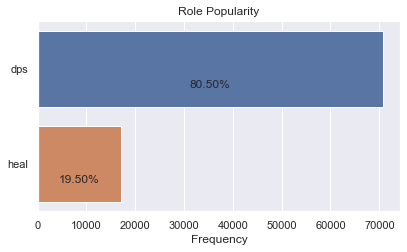

In [50]:
_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Role Popularity")
sns.countplot(y='Role',
              data=dfwow,
              ax=ax,
              order = dfwow['Role'].value_counts().index)
ax.set(ylabel='', xlabel='Frequency')

total = float(len(dfwow))
for p in ax.patches:
    width = p.get_width()
    ax.text(x=p.get_x() + p.get_width() / 2., 
              y=p.get_y() + p.get_height() * 0.75,
              s='{:1.2f}%'.format(width/total * 100),
              ha="center")




plt.show()

KeyError: 'Horde'

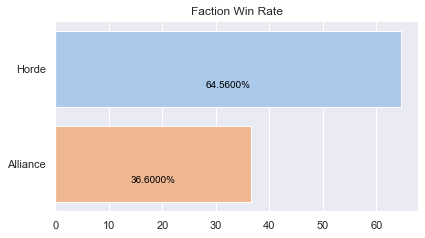

In [51]:
class_winrate = round(dfwow.groupby(['Faction'], as_index=False)['Win'].mean().sort_values(by=['Win'], ascending=False), 4)
class_winrate['Win'] *= 100

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name="Faction Win Rate", data=class_winrate, x='Win',
            y='Faction')
plt.show()

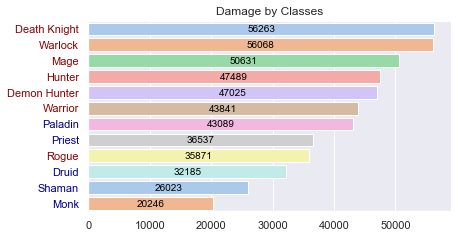

In [52]:
mean_dd = round(dfwow.groupby(['Class'], as_index=False)['Damage'].mean().sort_values(by=['Damage'], ascending=False))

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name="Damage by Classes", data=mean_dd, x='Damage',
            y='Class', orientation='horizontal', format_spec='{:1.0f}')
plt.show()

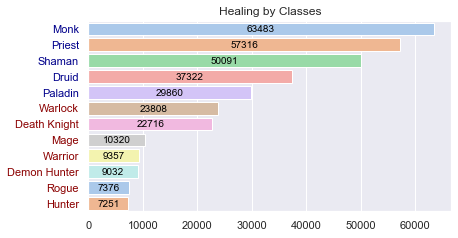

In [53]:
mean_hh = round(dfwow.groupby(['Class'], as_index=False)['Healed'].mean().sort_values(by=['Healed'], ascending=False))

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name="Healing by Classes", data=mean_hh, x='Healed',
            y='Class', orientation='horizontal', format_spec='{:1.0f}')
plt.show()

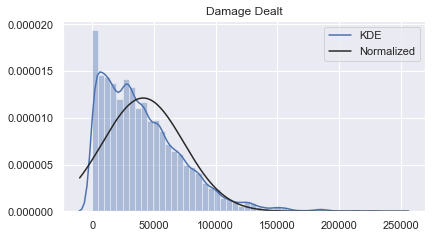

In [54]:
from scipy.stats import norm
_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Damage Dealt")
sns.distplot(dfwow['Damage'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

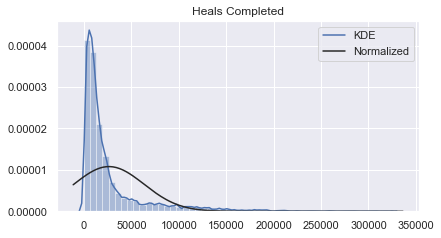

In [55]:
from scipy.stats import norm
_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Heals Completed")
sns.distplot(dfwow['Healed'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

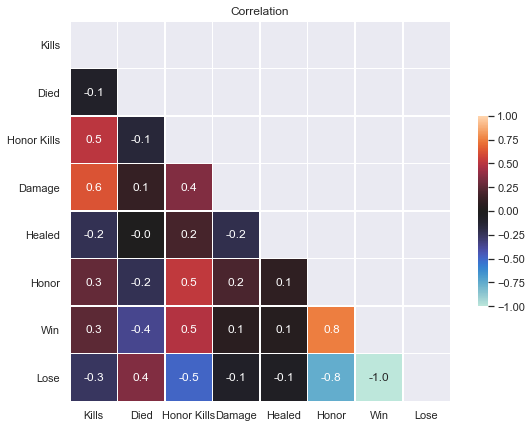

In [56]:
corr = dfwow.corr(method='pearson')

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

_, ax = plt.subplots(figsize=(10,7))
ax.set_title("Correlation")
sns.heatmap(corr, mask=mask, vmax=1, center=0, annot=True, fmt='.1f',
            square=True, linewidths=.5, cbar_kws={"shrink": .5});
plt.show()

In [73]:
dfwow = pd.read_csv('combinedcsv.csv', na_values="").fillna(0)
dfwow.replace(r'\s+', 0, regex=True)
dfwow.rename(columns={'Rol': 'Role'}, inplace=True)
dfwow.rename(columns={'DD': 'Damage'}, inplace=True)
dfwow.rename(columns={'HD': 'Healed'}, inplace=True)
dfwow.rename(columns={'KB': 'Kills'}, inplace=True)
dfwow.rename(columns={'HK': 'Honor Kills'}, inplace=True)
dfwow.rename(columns={'D': 'Died'}, inplace=True)
dfwow.rename(columns={'Battleground': 'BG'}, inplace=True)
dfwow.rename(columns={'Code': 'Battle Grounds'}, inplace=True)
dfwow.drop(['BE','BA','BD','CC','OP','VP','FC','FR',],axis=1,inplace=True)

In [59]:
wowgroups = ['DPS', 'Healers', 'Kills', 'Died', 'Honor Kills', 'Damage', 'Healed']
dfwow['DPS'] = (dfwow['Role'] == 'dps').astype(int)
dfwow['Healers'] = (dfwow['Role'] == 'heal').astype(int)
dfwow.drop(['Role', 'Honor'], axis=1, inplace=True)
dfwow = pd.get_dummies(dfwow, columns=['Class'])
for name in class_names:
    dfwow.rename(columns={'Class_' + name: name}, inplace=True)

matches_columns = ['Battle Grounds']
for Faction in ['Alliance', 'Horde']:
    matches_columns += [faction + ' ' + name for name in class_names]
    matches_columns += [faction + ' ' + stat for stat in wowgroups]

matches = pd.DataFrame(columns=matches_columns, index=range(matches_num))


for faction in ['Alliance', 'Horde']:
    for stat in wowgroups:
        matches[faction +' '+ stat] = np.array(dfwow[dfwow['Faction'] == faction].groupby(['Battle Grounds'])[stat].sum())
    for name in class_names:
        matches[faction +' '+ name] = np.array(dfwow[(dfwow['Faction'] == faction)].groupby(['Battle Grounds'])[name].sum())
matches.iloc[:,1:] = matches.iloc[:,1:].astype(int)

print('New dataset size:', matches.shape)
print('-'*27)
print('New features list:', *(matches.columns), sep='\n')
matches.head()

KeyError: 'Role'

In [70]:
dfwow.head

<bound method NDFrame.head of        BG Battle Grounds   Faction  Kills  Died  Honor Kills  Damage  Healed  \
0      WG            WG1     Horde      1     3           14   48155    6641   
1      WG            WG1     Horde      1     3           12   27025    7106   
2      WG            WG1  Alliance      0     1           19     824   93879   
3      WG            WG1  Alliance      1     2           25    7046   98599   
4      WG            WG1  Alliance      2     3           23   65483   19629   
...    ..            ...       ...    ...   ...          ...     ...     ...   
73245   0           WG42  Alliance      6     6           43   82892   14101   
73246   0           WG42  Alliance      1     5           36   45938    7169   
73247   0           WG42     Horde      0     5           42    3662  203000   
73248   0           WG42  Alliance      0     4           38   12342  153000   
73249   0           WG42  Alliance     10     6           40  126000   33219   

       Wi

In [71]:
list(dfwow)

['BG',
 'Battle Grounds',
 'Faction',
 'Kills',
 'Died',
 'Honor Kills',
 'Damage',
 'Healed',
 'Win',
 'Lose',
 'DPS',
 'Healers',
 'Death Knight',
 'Demon Hunter',
 'Druid',
 'Hunter',
 'Mage',
 'Monk',
 'Paladin',
 'Priest',
 'Rogue',
 'Shaman',
 'Warlock',
 'Warrior']

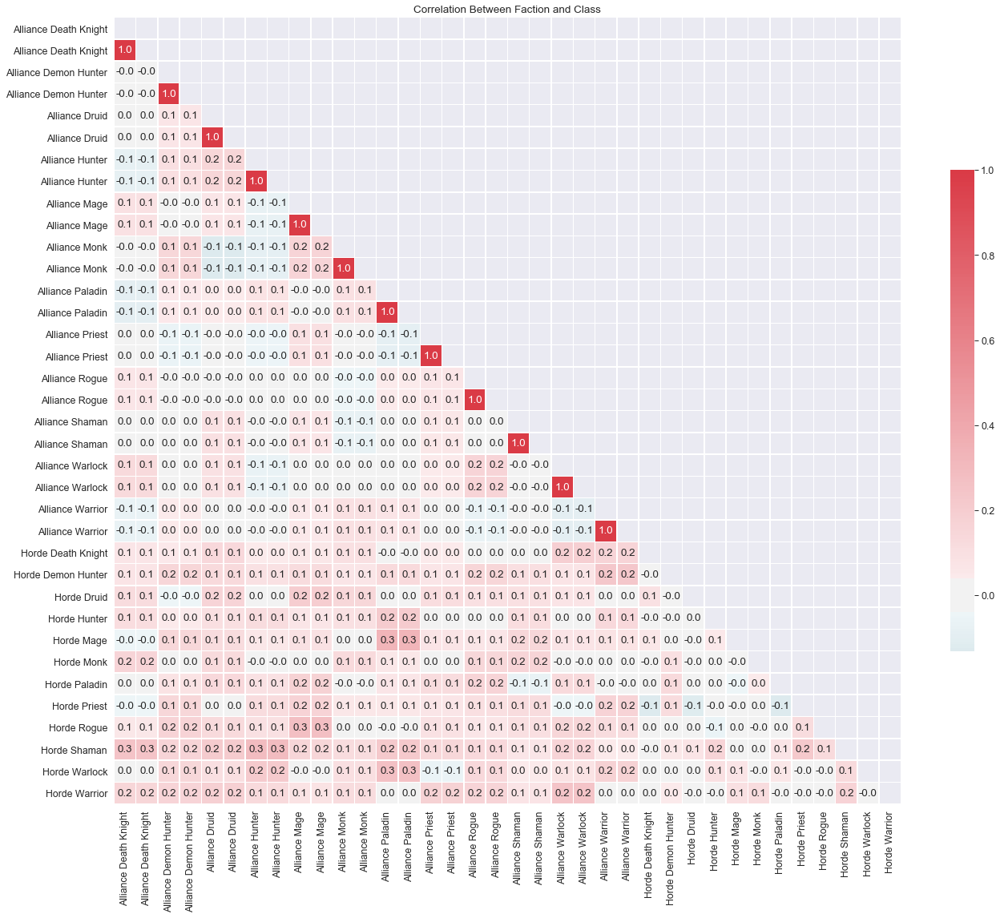

In [59]:
class_columns = []
for faction in ['Alliance', 'Horde']:
    for name in class_names:
        class_columns += [faction + ' ' + name]
        
classes_corr = matches[class_columns]
corr = classes_corr.corr(method='pearson')

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

_, ax = plt.subplots(figsize=(22,22.10))
ax.set_title("Correlation Between Faction and Class")
cmap = sns.diverging_palette(220, 10, as_cmap = True )
sns.heatmap(corr, cmap = cmap, mask=mask, vmax=1, center=0,
            annot=True, fmt='.1f', square=True, linewidths=.5,
            cbar_kws={"shrink": .5});
plt.show()

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Heals Completed")
sns.distplot(dfwow['Healed'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

In [61]:
matches['Battle Grounds'] = pd.factorize(matches['Battle Grounds'])[0]
np.random.seed(42)
matches = matches.sample(frac=1, random_state=42)
split = (0.7, 0.8)
rand_idx = np.random.randint(round(split[0] * (matches_num - 1)), round(split[1] * (matches_num - 1)))
df_train = matches[:rand_idx]
df_test = matches[rand_idx:]

print('Dataset divided')
print('Train sample size:', len(df_train), 'matches |', '{:d}%'.format(round(len(df_train) / len(matches) * 100)))
print('Train sample size:', len(df_test), 'matches  |', '{:d}%'.format(round(len(df_test) / len(matches) * 100)))

Dataset divided
Train sample size: 180 matches | 72%
Train sample size: 69 matches  | 28%


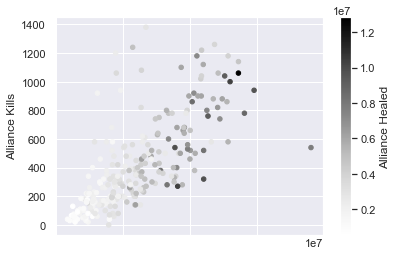

In [154]:
ax2 = matches.plot.scatter(x='Alliance Damage',
...                       y='Alliance Kills',
...                       c='Alliance Healed')

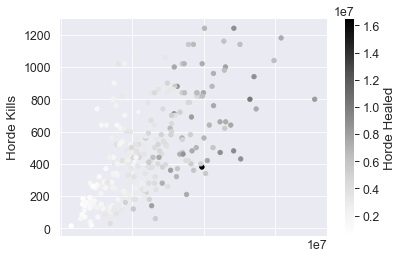

In [84]:
ax2 = matches.plot.scatter(x='Horde Damage',
...                       y='Horde Kills',
...                       c='Horde Healed')

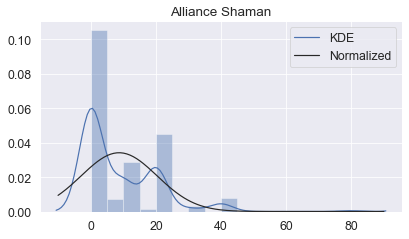

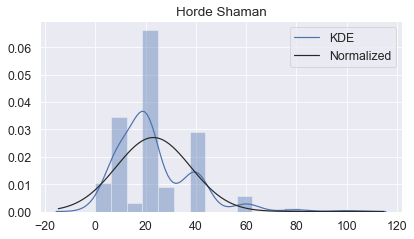

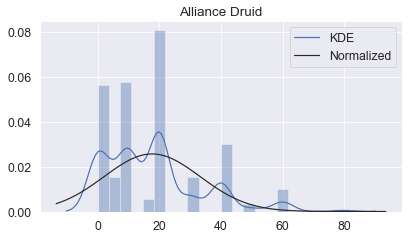

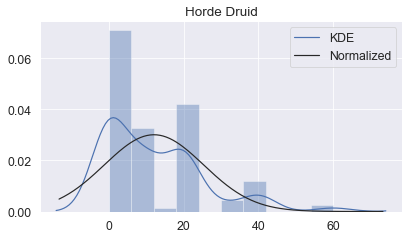

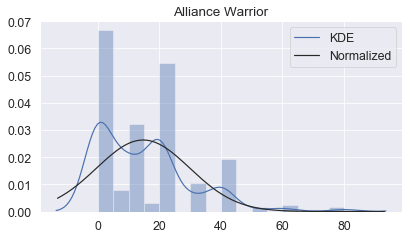

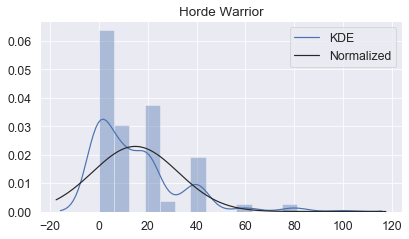

In [102]:
from scipy.stats import norm
_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Alliance Shaman")
sns.distplot(matches['Alliance Shaman'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Horde Shaman")
sns.distplot(matches['Horde Shaman'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Alliance Druid")
sns.distplot(matches['Alliance Druid'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Horde Druid")
sns.distplot(matches['Horde Druid'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Alliance Warrior")
sns.distplot(matches['Alliance Warrior'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Horde Warrior")
sns.distplot(matches['Horde Warrior'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

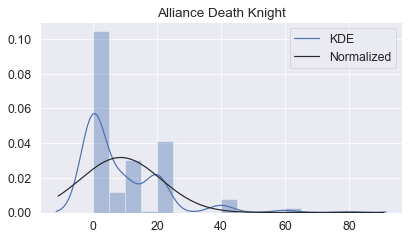

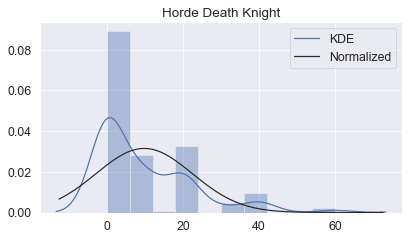

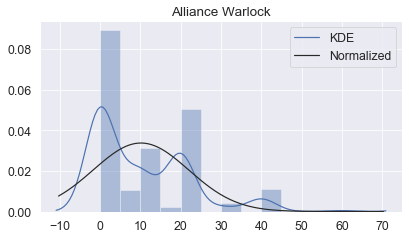

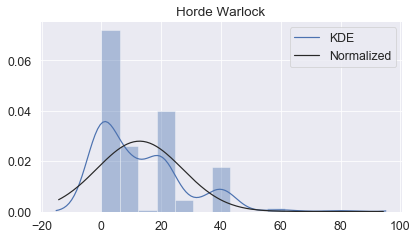

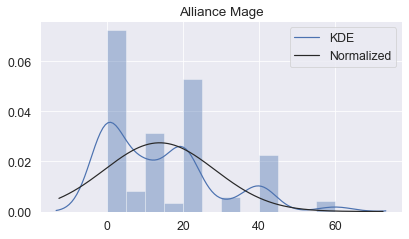

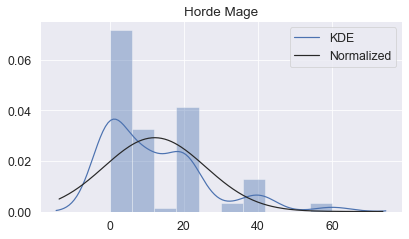

In [103]:
from scipy.stats import norm
_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Alliance Death Knight")
sns.distplot(matches['Alliance Death Knight'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Horde Death Knight")
sns.distplot(matches['Horde Death Knight'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Alliance Warlock")
sns.distplot(matches['Alliance Warlock'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Horde Warlock")
sns.distplot(matches['Horde Warlock'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Alliance Mage")
sns.distplot(matches['Alliance Mage'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Horde Mage")
sns.distplot(matches['Horde Mage'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

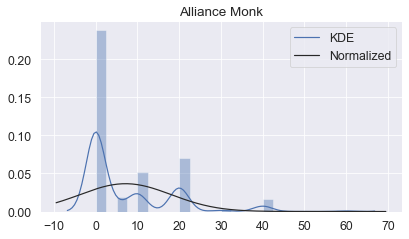

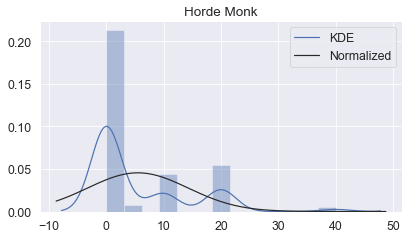

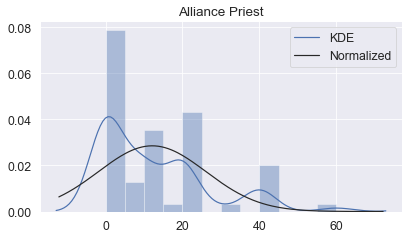

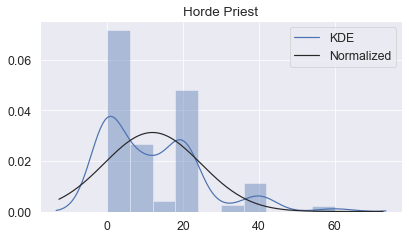

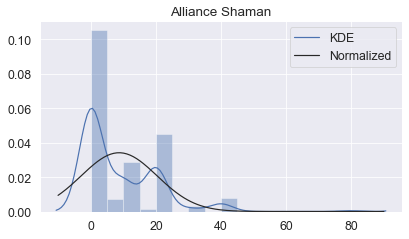

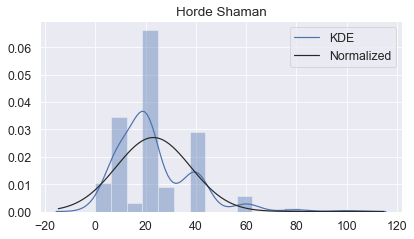

In [104]:
from scipy.stats import norm
_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Alliance Monk")
sns.distplot(matches['Alliance Monk'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Horde Monk")
sns.distplot(matches['Horde Monk'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Alliance Priest")
sns.distplot(matches['Alliance Priest'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Horde Priest")
sns.distplot(matches['Horde Priest'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Alliance Shaman")
sns.distplot(matches['Alliance Shaman'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Horde Shaman")
sns.distplot(matches['Horde Shaman'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

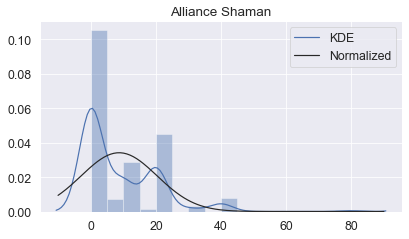

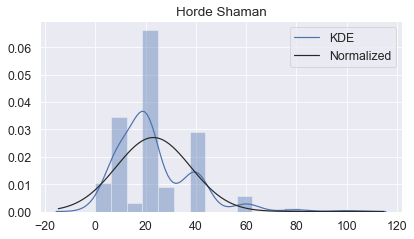

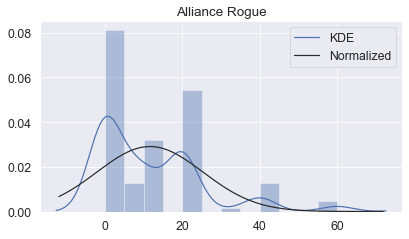

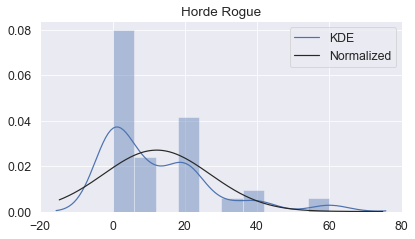

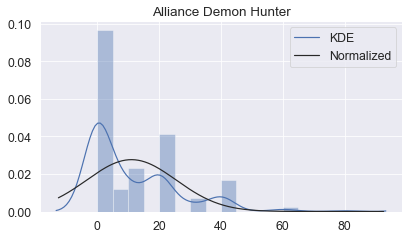

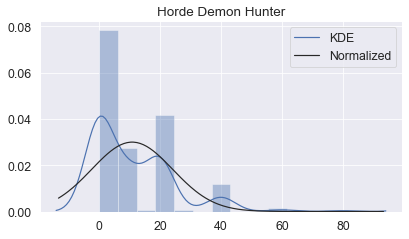

In [105]:
_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Alliance Shaman")
sns.distplot(matches['Alliance Shaman'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Horde Shaman")
sns.distplot(matches['Horde Shaman'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Alliance Rogue")
sns.distplot(matches['Alliance Rogue'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Horde Rogue")
sns.distplot(matches['Horde Rogue'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Alliance Demon Hunter")
sns.distplot(matches['Alliance Demon Hunter'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
ax.set_title("Horde Demon Hunter")
sns.distplot(matches['Horde Demon Hunter'],
             fit=norm,
             ax=ax,
             kde_kws={'label': 'KDE'},
             fit_kws={'label': 'Normalized'})
ax.set(ylabel='', xlabel='')
plt.legend()
plt.show()

In [74]:
dfwow_win = pd.read_csv('combinedcsv.csv', na_values="").fillna(0)
dfwow_win.replace(r'\s+', 0, regex=True)
dfwow_win.rename(columns={'Rol': 'Role'}, inplace=True)
dfwow_win.rename(columns={'DD': 'Damage'}, inplace=True)
dfwow_win.rename(columns={'HD': 'Healed'}, inplace=True)
dfwow_win.rename(columns={'Battleground': 'BG'}, inplace=True)
dfwow_win.rename(columns={'Code': 'Battle Grounds'}, inplace=True)
dfwow_win.drop(['KB','HK','D','BE','BA','BD','CC','OP','VP','FC','FR',],axis=1,inplace=True)
dfwow_win = dfwow_win[dfwow_win.Class != 'Death Knight']
dfwow_win = dfwow_win[dfwow_win.Class != 'Druid']
dfwow_win = dfwow_win[dfwow_win.Class != 'Hunter']
dfwow_win = dfwow_win[dfwow_win.Class != 'Mage']
dfwow_win = dfwow_win[dfwow_win.Class != 'Monk']
dfwow_win = dfwow_win[dfwow_win.Class != 'Paladin']
dfwow_win = dfwow_win[dfwow_win.Class != 'Priest']
dfwow_win = dfwow_win[dfwow_win.Class != 'Warlock']
dfwow_win = dfwow_win[dfwow_win.Class != 'Warrior']

In [75]:
print(dfwow_win.head)
print(dfwow_win.shape)

<bound method NDFrame.head of        BG Battle Grounds   Faction         Class  Damage  Healed  Honor  Win  \
4      WG            WG1  Alliance         Rogue   65483   19629    268  0.0   
6      WG            WG1     Horde        Shaman   12933   94587    541  1.0   
10     WG            WG1  Alliance         Rogue   22327    2394    171  0.0   
11     WG            WG1  Alliance  Demon Hunter   29664    4364    242  0.0   
13     WG            WG1     Horde  Demon Hunter  125000   17460    543  1.0   
...    ..            ...       ...           ...     ...     ...    ...  ...   
87888   0           WG42  Alliance         Rogue   43471    3133    330  0.0   
87889   0           WG42     Horde        Shaman   10648   72337    521  1.0   
87891   0           WG42  Alliance  Demon Hunter   38418    2815    370  0.0   
87892   0           WG42     Horde        Shaman    2385   42075    373  1.0   
87896   0           WG42  Alliance  Demon Hunter   45938    7169    366  0.0   

       Lo

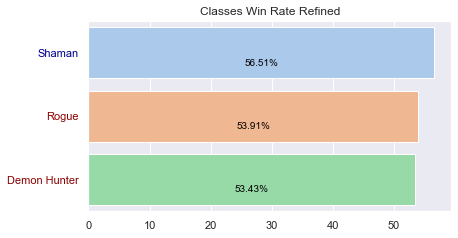

In [183]:
class_winrate2 = round(dfwow_win.groupby(['Class'], as_index=False)['Win'].mean().sort_values(by=['Win'], ascending=False), 4)
class_winrate2['Win'] *= 100

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name="Classes Win Rate Refined", data=class_winrate2, x='Win',
            y='Class', orientation='horizontal', format_spec='{:1.2f}%')
plt.show()

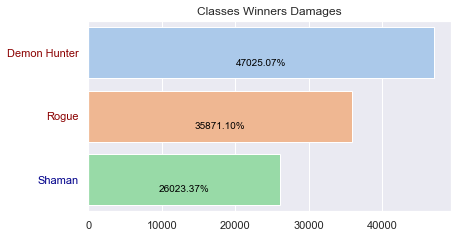

In [194]:
class_winrate3 = round(dfwow_win.groupby(['Class'], as_index=False)['Damage'].mean().sort_values(by=['Damage'], ascending=False), 4)
class_winrate3['Damage'] *= 1

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name="Classes Winners Damages", data=class_winrate3, x='Damage',
            y='Class', orientation='horizontal', format_spec='{:1.2f}%')
plt.show()

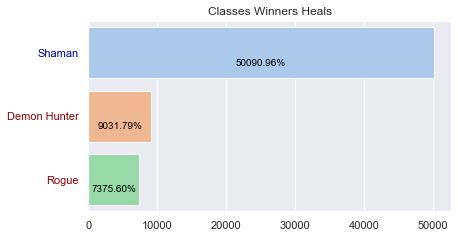

In [187]:
class_winrate4 = round(dfwow_win.groupby(['Class'], as_index=False)['Healed'].mean().sort_values(by=['Healed'], ascending=False), 4)
class_winrate4['Healed'] *= 1

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name="Classes Winners Heals", data=class_winrate4, x='Healed',
            y='Class', orientation='horizontal', format_spec='{:1.2f}%')
plt.show()

In [76]:
dfwow_dps = pd.read_csv('combinedcsv.csv', na_values="").fillna(0)
dfwow_dps.replace(r'\s+', 0, regex=True)
dfwow_dps.rename(columns={'Rol': 'Role'}, inplace=True)
dfwow_dps.rename(columns={'DD': 'Damage'}, inplace=True)
dfwow_dps.rename(columns={'HD': 'Healed'}, inplace=True)
dfwow_dps.rename(columns={'Battleground': 'BG'}, inplace=True)
dfwow_dps.rename(columns={'Code': 'Battle Grounds'}, inplace=True)
dfwow_dps.drop(['KB','HK','D','BE','BA','BD','CC','OP','VP','FC','FR',],axis=1,inplace=True)
dfwow_dps = dfwow_dps[dfwow_dps.Class != 'Demon Hunter']
dfwow_dps = dfwow_dps[dfwow_dps.Class != 'Druid']
dfwow_dps = dfwow_dps[dfwow_dps.Class != 'Hunter']
dfwow_dps = dfwow_dps[dfwow_dps.Class != 'Shaman']
dfwow_dps = dfwow_dps[dfwow_dps.Class != 'Monk']
dfwow_dps = dfwow_dps[dfwow_dps.Class != 'Paladin']
dfwow_dps = dfwow_dps[dfwow_dps.Class != 'Priest']
dfwow_dps = dfwow_dps[dfwow_dps.Class != 'Rogue']
dfwow_dps = dfwow_dps[dfwow_dps.Class != 'Warrior']


In [189]:
print(dfwow_dps.head)
print(dfwow_dps.shape)


<bound method NDFrame.head of        BG Battle Grounds   Faction         Class  Damage  Healed  Honor  Win  \
1      WG            WG1     Horde  Death Knight   27025    7106    377  1.0   
14     WG            WG1  Alliance       Warlock  101000   21853    270  0.0   
15     WG            WG1  Alliance       Warlock  124000   27687    274  0.0   
21     WG            WG2     Horde  Death Knight   15387   11309    140  0.0   
23     WG            WG2     Horde  Death Knight   29076    6734    145  0.0   
...    ..            ...       ...           ...     ...     ...    ...  ...   
73220   0           WG41  Alliance          Mage   58848    4638    131  0.0   
73230   0           WG42     Horde  Death Knight   79710    9567    530  1.0   
73231   0           WG42  Alliance          Mage   84333    4704    278  0.0   
73235   0           WG42     Horde          Mage   78180   24147    382  1.0   
73249   0           WG42  Alliance  Death Knight  126000   33219    383  0.0   

       Lo

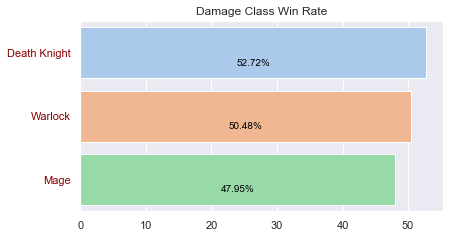

In [191]:
class_dpsrate2 = round(dfwow_dps.groupby(['Class'], as_index=False)['Win'].mean().sort_values(by=['Win'], ascending=False), 4)
class_dpsrate2 ['Win'] *= 100

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name="Damage Class Win Rate", data=class_dpsrate2, x='Win',
            y='Class', orientation='horizontal', format_spec='{:1.2f}%')
plt.show()


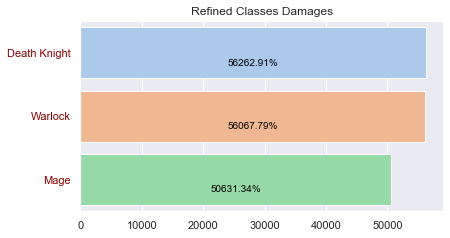

In [193]:
class_dpsrate3 = round(dfwow_dps.groupby(['Class'], as_index=False)['Damage'].mean().sort_values(by=['Damage'], ascending=False), 4)
class_dpsrate3 ['Damage'] *= 1

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name="Refined Classes Damages", data=class_dpsrate3, x='Damage',
            y='Class', orientation='horizontal', format_spec='{:1.2f}%')
plt.show()


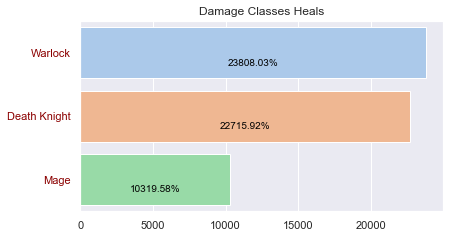

In [195]:
class_dpsrate4 = round(dfwow_dps.groupby(['Class'], as_index=False)['Healed'].mean().sort_values(by=['Healed'], ascending=False), 4)
class_dpsrate4 ['Healed'] *= 1

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name="Damage Classes Heals", data=class_dpsrate4, x='Healed',
            y='Class', orientation='horizontal', format_spec='{:1.2f}%')
plt.show()


In [77]:
dfwow_heal = pd.read_csv('combinedcsv.csv', na_values="").fillna(0)
dfwow_heal.replace(r'\s+', 0, regex=True)
dfwow_heal.rename(columns={'Rol': 'Role'}, inplace=True)
dfwow_heal.rename(columns={'DD': 'Damage'}, inplace=True)
dfwow_heal.rename(columns={'HD': 'Healed'}, inplace=True)
dfwow_heal.rename(columns={'Battleground': 'BG'}, inplace=True)
dfwow_heal.rename(columns={'Code': 'Battle Grounds'}, inplace=True)
dfwow_heal.drop(['KB','HK','D','BE','BA','BD','CC','OP','VP','FC','FR',],axis=1,inplace=True)
dfwow_heal = dfwow_heal[dfwow_heal.Class != 'Death Knight']
dfwow_heal = dfwow_heal[dfwow_heal.Class != 'Druid']
dfwow_heal = dfwow_heal[dfwow_heal.Class != 'Hunter']
dfwow_heal = dfwow_heal[dfwow_heal.Class != 'Mage']
dfwow_heal = dfwow_heal[dfwow_heal.Class != 'Demon Hunter']
dfwow_heal = dfwow_heal[dfwow_heal.Class != 'Paladin']
dfwow_heal = dfwow_heal[dfwow_heal.Class != 'Rogue']
dfwow_heal = dfwow_heal[dfwow_heal.Class != 'Warlock']
dfwow_heal = dfwow_heal[dfwow_heal.Class != 'Warrior']


In [197]:
print(dfwow_heal.head)
print(dfwow_heal.shape)


<bound method NDFrame.head of        BG Battle Grounds   Faction   Class  Damage  Healed  Honor  Win  Lose  \
6      WG            WG1     Horde  Shaman   12933   94587    541  1.0   0.0   
7      WG            WG1  Alliance  Priest  123000   34687    269  0.0   1.0   
9      WG            WG1  Alliance  Priest   12566   36734    276  0.0   1.0   
18     WG            WG1     Horde  Shaman   43666   17475    383  1.0   0.0   
20     WG            WG2  Alliance  Priest    1632   45269    524  1.0   0.0   
...    ..            ...       ...     ...     ...     ...    ...  ...   ...   
73221   0           WG41     Horde  Shaman   70954    4853    485  1.0   0.0   
73233   0           WG42  Alliance  Priest   16260  150000    390  0.0   1.0   
73234   0           WG42  Alliance  Priest  183000   38293    387  0.0   1.0   
73239   0           WG42     Horde  Shaman   10648   72337    521  1.0   0.0   
73242   0           WG42     Horde  Shaman    2385   42075    373  1.0   0.0   

       Ro

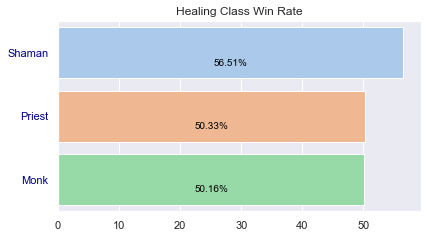

In [199]:
class_Heal2 = round(dfwow_heal.groupby(['Class'], as_index=False)['Win'].mean().sort_values(by=['Win'], ascending=False), 4)
class_Heal2['Win'] *= 100

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name="Healing Class Win Rate", data= class_Heal2, x='Win',
            y='Class', orientation='horizontal', format_spec='{:1.2f}%')
plt.show()


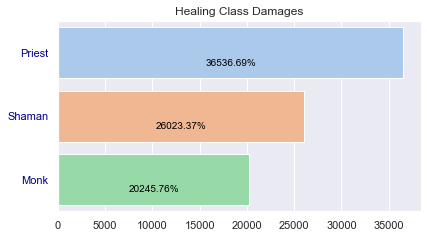

In [201]:
class_Heal3 = round(dfwow_heal.groupby(['Class'], as_index=False)['Damage'].mean().sort_values(by=['Damage'], ascending=False), 4)
class_Heal3 ['Damage'] *= 1

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name="Healing Class Damages", data= class_Heal3, x='Damage',
            y='Class', orientation='horizontal', format_spec='{:1.2f}%')
plt.show()


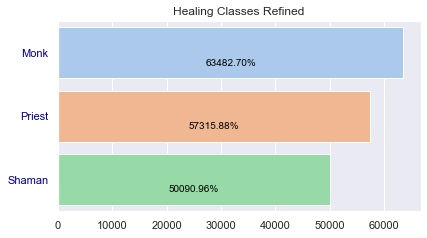

In [202]:
class_Heal4 = round(dfwow_heal.groupby(['Class'], as_index=False)['Healed'].mean().sort_values(by=['Healed'], ascending=False), 4)
class_Heal4 ['Healed'] *= 1

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name="Healing Classes Refined", data= class_Heal4, x='Healed',
            y='Class', orientation='horizontal', format_spec='{:1.2f}%')
plt.show()


In [80]:
dfwow_pop = pd.read_csv('combinedcsv.csv', na_values="").fillna(0)
dfwow_pop.replace(r'\s+', 0, regex=True)
dfwow_pop.rename(columns={'Rol': 'Role'}, inplace=True)
dfwow_pop.rename(columns={'DD': 'Damage'}, inplace=True)
dfwow_pop.rename(columns={'HD': 'Healed'}, inplace=True)
dfwow_pop.rename(columns={'Battleground': 'BG'}, inplace=True)
dfwow_pop.rename(columns={'Code': 'Battle Grounds'}, inplace=True)
dfwow_pop.drop(['KB','HK','D','BE','BA','BD','CC','OP','VP','FC','FR',],axis=1,inplace=True)
dfwow_pop = dfwow_pop[dfwow_pop.Class != 'Death Knight']
dfwow_pop = dfwow_pop[dfwow_pop.Class != 'Demon Hunter']
dfwow_pop = dfwow_pop[dfwow_pop.Class != 'Hunter']
dfwow_pop = dfwow_pop[dfwow_pop.Class != 'Mage']
dfwow_pop = dfwow_pop[dfwow_pop.Class != 'Monk']
dfwow_pop = dfwow_pop[dfwow_pop.Class != 'Paladin']
dfwow_pop = dfwow_pop[dfwow_pop.Class != 'Priest']
dfwow_pop = dfwow_pop[dfwow_pop.Class != 'Warlock']
dfwow_pop = dfwow_pop[dfwow_pop.Class != 'Rogue']


In [81]:
print(dfwow_pop.head)
print(dfwow_pop.shape)


<bound method NDFrame.head of        BG Battle Grounds   Faction    Class  Damage  Healed  Honor  Win  Lose  \
5      WG            WG1     Horde    Druid   31759    6071    531  1.0   0.0   
6      WG            WG1     Horde   Shaman   12933   94587    541  1.0   0.0   
8      WG            WG1     Horde    Druid   13900    2438    523  1.0   0.0   
16     WG            WG1  Alliance    Druid    6796    2738    248  0.0   1.0   
18     WG            WG1     Horde   Shaman   43666   17475    383  1.0   0.0   
...    ..            ...       ...      ...     ...     ...    ...  ...   ...   
87882   0           WG42  Alliance  Warrior   36170    7606    332  0.0   1.0   
87889   0           WG42     Horde   Shaman   10648   72337    521  1.0   0.0   
87892   0           WG42     Horde   Shaman    2385   42075    373  1.0   0.0   
87895   0           WG42  Alliance  Warrior   82892   14101    387  0.0   1.0   
87897   0           WG42     Horde    Druid    3662  203000    383  1.0   0.0  

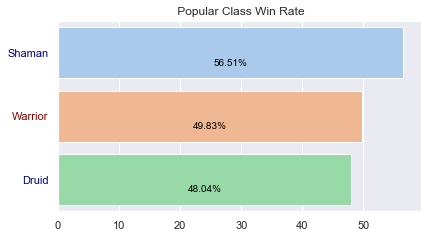

In [82]:
class_pop2 = round(dfwow_pop.groupby(['Class'], as_index=False)['Win'].mean().sort_values(by=['Win'], ascending=False), 4)
class_pop2['Win'] *= 100

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name=" Popular Class Win Rate", data= class_pop2, x='Win',
            y='Class', orientation='horizontal', format_spec='{:1.2f}%')
plt.show()


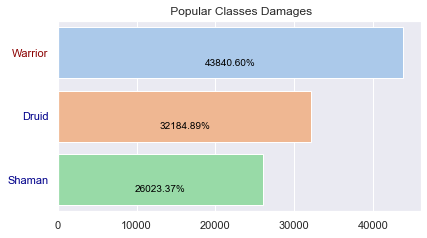

In [83]:
class_pop3 = round(dfwow_pop.groupby(['Class'], as_index=False)['Damage'].mean().sort_values(by=['Damage'], ascending=False), 4)
class_pop3 ['Damage'] *= 1

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name=" Popular Classes Damages", data= class_pop3, x='Damage',
            y='Class', orientation='horizontal', format_spec='{:1.2f}%')
plt.show()


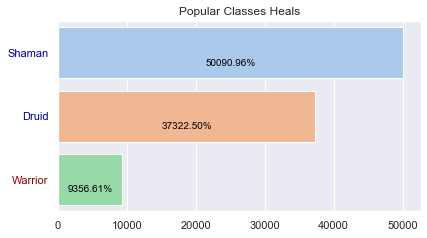

In [85]:
class_pop4 = round(dfwow_pop.groupby(['Class'], as_index=False)['Healed'].mean().sort_values(by=['Healed'], ascending=False), 4)
class_pop4 ['Healed'] *= 1

_, ax = plt.subplots(1, 1, figsize=(6.5, 3.5))
my_bar_plot(ax, name="Popular Classes Heals", data= class_pop4, x='Healed',
            y='Class', orientation='horizontal', format_spec='{:1.2f}%')
plt.show()


In [95]:
dfwow_top3 = pd.read_csv('combinedcsv.csv', na_values="").fillna(0)
dfwow_top3.replace(r'\s+', 0, regex=True)
dfwow_top3.rename(columns={'Rol': 'Role'}, inplace=True)
dfwow_top3.rename(columns={'DD': 'Damage'}, inplace=True)
dfwow_top3.rename(columns={'HD': 'Healed'}, inplace=True)
dfwow_top3.rename(columns={'Battleground': 'BG'}, inplace=True)
dfwow_top3.rename(columns={'Code': 'Battle Grounds'}, inplace=True)
dfwow_top3.drop(['KB','HK','D','BE','BA','BD','CC','OP','VP','FC','FR',],axis=1,inplace=True)
dfwow_top3 = dfwow_top3[dfwow_top3.Class != 'Demon Hunter']
dfwow_top3 = dfwow_top3[dfwow_top3.Class != 'Druid']
dfwow_top3 = dfwow_top3[dfwow_top3.Class != 'Hunter']
dfwow_top3 = dfwow_top3[dfwow_top3.Class != 'Mage']
dfwow_top3 = dfwow_top3[dfwow_top3.Class != 'Monk']
dfwow_top3 = dfwow_top3[dfwow_top3.Class != 'Paladin']
dfwow_top3 = dfwow_top3[dfwow_top3.Class != 'Rogue']
dfwow_top3 = dfwow_top3[dfwow_top3.Class != 'Warlock']
dfwow_top3 = dfwow_top3[dfwow_top3.Class != 'Warrior']


In [96]:
print(dfwow_top3.head)
print(dfwow_top3.shape)


<bound method NDFrame.head of        BG Battle Grounds   Faction         Class  Damage  Healed  Honor  Win  \
1      WG            WG1     Horde  Death Knight   27025    7106    377  1.0   
6      WG            WG1     Horde        Shaman   12933   94587    541  1.0   
7      WG            WG1  Alliance        Priest  123000   34687    269  0.0   
9      WG            WG1  Alliance        Priest   12566   36734    276  0.0   
18     WG            WG1     Horde        Shaman   43666   17475    383  1.0   
...    ..            ...       ...           ...     ...     ...    ...  ...   
87883   0           WG42  Alliance        Priest   16260  150000    390  0.0   
87884   0           WG42  Alliance        Priest  183000   38293    387  0.0   
87889   0           WG42     Horde        Shaman   10648   72337    521  1.0   
87892   0           WG42     Horde        Shaman    2385   42075    373  1.0   
87899   0           WG42  Alliance  Death Knight  126000   33219    383  0.0   

       Lo

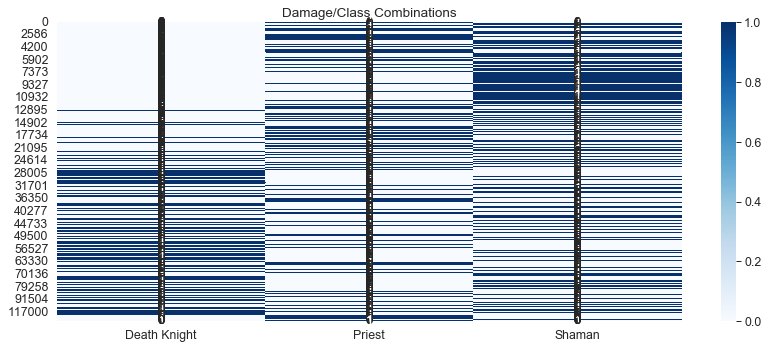

In [109]:
Fin_role_class_mix = dfwow_top3.pivot_table(values='Role', index='Damage', columns='Class', aggfunc=lambda x: x.value_counts().count()).fillna(0).astype(int)

_, ax = plt.subplots(1, 1, figsize=(14, 5.5))
sns.set_context("paper", font_scale=1.4) 
sns.heatmap(Fin_role_class_mix, annot=True,cmap='Blues', fmt='g', ax=ax)
plt.title('Damage/Class Combinations')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
ax.set_yticklabels(ax.get_yticklabels(), va='center')
ax.set(ylabel='', xlabel='')
plt.show()

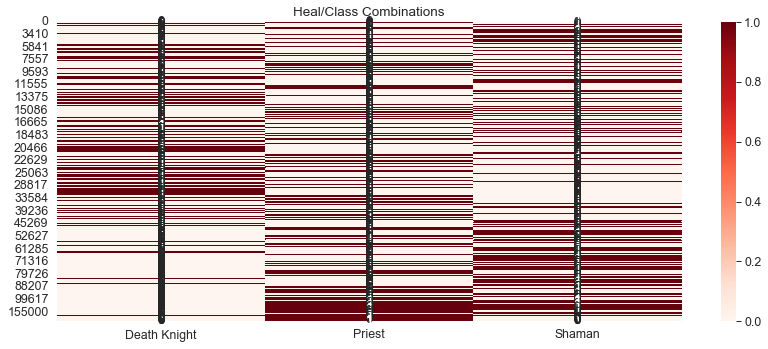

In [110]:
Finh_role_class_mix = dfwow_top3.pivot_table(values='Role', index='Healed', columns='Class', aggfunc=lambda x: x.value_counts().count()).fillna(0).astype(int)

_, ax = plt.subplots(1, 1, figsize=(14, 5.5))
sns.set_context("paper", font_scale=1.4) 
sns.heatmap(Finh_role_class_mix, annot=True,cmap='Reds', fmt='g', ax=ax)
plt.title('Heal/Class Combinations')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
ax.set_yticklabels(ax.get_yticklabels(), va='center')
ax.set(ylabel='', xlabel='')
plt.show()

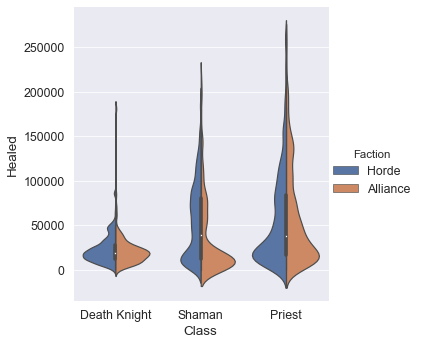

In [115]:
sns.catplot(x="Class", y="Healed", hue="Faction",
            kind="violin", split=True, data=dfwow_top3);

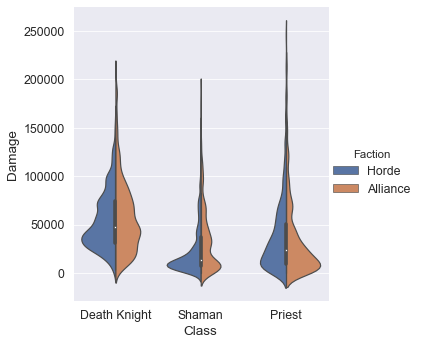

In [116]:
sns.catplot(x="Class", y="Damage", hue="Faction",
            kind="violin", split=True, data=dfwow_top3);

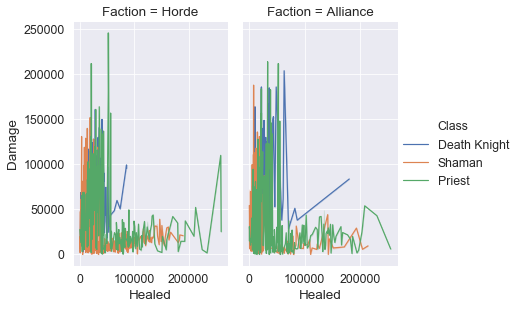

In [118]:
sns.relplot(x="Healed", y="Damage", col="Faction",
            hue="Class",
            height=4.5, aspect=2 / 3,
            facet_kws=dict(sharex=False),
            kind="line", legend="full", data=dfwow_top3);

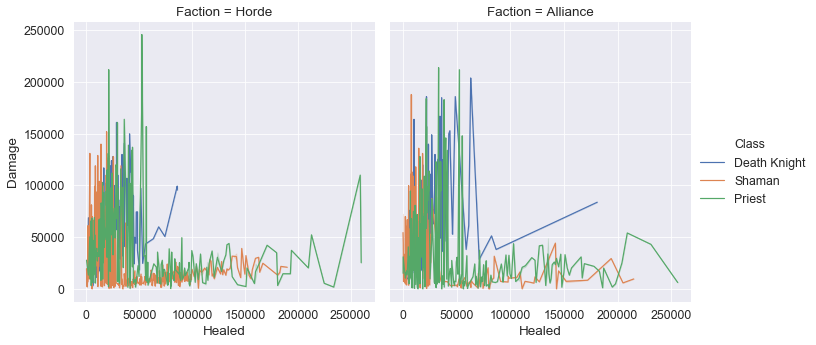

In [119]:
sns.relplot(x="Healed", y="Damage", col="Faction",
            hue="Class",
            facet_kws=dict(sharex=False),
            kind="line", legend="full", data=dfwow_top3);